# Introduction

* __Objective__
 * Build an end-to-end predictive machine learning model that can take any new song we like and predict its genre.


* __Goals__
 * Find premade datasets and or curate a training set that's based on Spotify's API for the predictive model.
 * Implement basic preprocessing & EDA and feature analysis (engineering, selection, etc).
 * Develop a model that shows good intelligence in genre prediction, also include a random baseline model for comparison.
 * Assess which genres were better predicted and which ones didn't do as well.
 * Build a __prediction function__ that you can give a song title __and__ artist to that's capable of querying Spotify's API to drive a predictive guess on what the genre could be.


* __Initial Questions__
    * What are the average tempo & energy, key for different genres?
    * What about the most popular songs, in each genre, and what's their tempo & energy?
    * Can a song's musical elements (valence, loudness, instrumentalness, bpm) strongly indicate whether or not it belongs to a specific genre?

## Libraries

In [2]:
# import relevant libraries to project

import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import math as mt
import plotly.express as px
import numpy as np

from sklearn.metrics import roc_auc_score, f1_score, accuracy_score
from sklearn.metrics import confusion_matrix, classification_report, precision_recall_curve, accuracy_score, ConfusionMatrixDisplay, auc, roc_curve
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.linear_model import LogisticRegression
from sklearn.dummy import DummyClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_predict
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.svm import SVC


#turn off warnings
import warnings
warnings.filterwarnings('ignore')


In [3]:
# from google.colab import drive
# drive.mount('/content/drive')

In [4]:
data = pd.read_csv("/Users/monte/Desktop/dataset.csv")

In [5]:
# data = pd.read_csv("dataset.csv")
# data = pd.read_csv("/Users/monte/Desktop/dataset.csv")

## Data Wrangling

In [6]:
# this function retrieves info on...
def dataset_info(df):
    # Potential Dups
    print("..... Duplicate Rows .....")
    print(f'Total Duplicates: {df.duplicated().sum()}\n')

    # A DF's Shape
    print("\n..... DataFrame Shape .....")
    print(f"Rows: {df.shape[0]}, Columns: {df.shape[1]}")
    print("\n")

    # Potential missing values
    print("..... Missing Values .....")
    print(df.isna().sum(), '\n')

    # A DF's basic info
    print("..... DataFrame Information .....")
    df.info()
    print("\n")

    # Any particular column's unique values
    print("..... Unique Values per Column .....")
    for column in df.columns:
        unique_vals = df[column].nunique()
        print(f'{column}: {unique_vals} unique values')
    print("\n")

    # A DF's first 10 rows
    print("..... DataFrame Head .....")
    display(df.head(10))

    # A DF's 10 Sample rows
    print("..... DataFrame's Sampled Rows .....")
    display(df.sample(10))
    return

In [7]:
def mins_rounded(seconds):
    duration = seconds / 1000
    return mt.ceil(duration)
data['secs_rounded'] = data['duration_ms'].apply(mins_rounded)

In [8]:
dataset_info(data)

..... Duplicate Rows .....
Total Duplicates: 0


..... DataFrame Shape .....
Rows: 114000, Columns: 22


..... Missing Values .....
Unnamed: 0          0
track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
secs_rounded        0
dtype: int64 

..... DataFrame Information .....
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 22 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 no

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,secs_rounded
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,acoustic,231
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,acoustic,150
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,acoustic,211
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,acoustic,202
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,acoustic,199
5,5,01MVOl9KtVTNfFiBU9I7dc,Tyrone Wells,Days I Will Remember,Days I Will Remember,58,214240,False,0.688,0.4810,...,1,0.1050,0.2890,0.000000,0.1890,0.6660,98.017,4,acoustic,215
6,6,6Vc5wAMmXdKIAM7WUoEb7N,A Great Big World;Christina Aguilera,Is There Anybody Out There?,Say Something,74,229400,False,0.407,0.1470,...,1,0.0355,0.8570,0.000003,0.0913,0.0765,141.284,3,acoustic,230
7,7,1EzrEOXmMH3G43AXT1y7pA,Jason Mraz,We Sing. We Dance. We Steal Things.,I'm Yours,80,242946,False,0.703,0.4440,...,1,0.0417,0.5590,0.000000,0.0973,0.7120,150.960,4,acoustic,243
8,8,0IktbUcnAGrvD03AWnz3Q8,Jason Mraz;Colbie Caillat,We Sing. We Dance. We Steal Things.,Lucky,74,189613,False,0.625,0.4140,...,1,0.0369,0.2940,0.000000,0.1510,0.6690,130.088,4,acoustic,190
9,9,7k9GuJYLp2AzqokyEdwEw2,Ross Copperman,Hunger,Hunger,56,205594,False,0.442,0.6320,...,1,0.0295,0.4260,0.004190,0.0735,0.1960,78.899,4,acoustic,206


..... DataFrame's Sampled Rows .....


,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,secs_rounded
30706,30706,2wmQfaHp4zbqQkbf5nu5SF,Cartoon;Coleman Trapp,Why We Lose,Why We Lose,65,197485,False,0.423,0.920,...,0,0.0428,0.00123,0.009920,0.3290,0.0951,174.976,4,edm,198
18432,18432,6HyWF4aQ7r62g8cRqCrXz2,Robert Schimmel,Life Since Then,Chemotherapy,22,132520,True,0.599,0.369,...,1,0.9620,0.92100,0.000000,0.6960,0.4940,83.026,5,comedy,133
27414,27414,37aP7sxMcaRmHNG4dvkmBN,Maduk;Nymfo,Crossroads / Ordinary Ways,Crossroads,19,313456,False,0.529,0.932,...,0,0.0419,0.00111,0.849000,0.3220,0.2000,174.007,4,drum-and-bass,314
43237,43237,2iu9LUbXaI6TKdV6Iwl5Hv,Kemuel,Clássicos,Em Fervente Oração,34,297170,False,0.296,0.215,...,1,0.0304,0.94200,0.000000,0.2610,0.2950,103.006,4,groove,298
62239,62239,3e8V29PYhoHxZY9lQ84Boe,Jamie Cullum,All I Want For Christmas Is You,It's Christmas,0,180626,False,0.534,0.533,...,0,0.0470,0.50000,0.000000,0.0875,0.4780,136.854,4,j-pop,181
35234,35234,7nnhs7e3iQbiKc1xBRF927,Solange Almeida,"Entre Nós, Minha História",Indecisão,44,196948,False,0.469,0.842,...,1,0.1070,0.14600,0.000000,0.7130,0.7220,178.039,4,forro,197
54160,54160,4Pan7TopeodcU4Gyb8MMGt,Sonmi451,Nachtmuziek,Quiet Piece for Bram,13,333346,False,0.275,0.271,...,0,0.0435,0.95200,0.835000,0.0985,0.3340,117.238,4,idm,334
54463,54463,4X6H6TvuTbuUO1q5KED9ng,Cybass,Akane (Original Soundtrack),"Guns, Lots of Guns",12,171428,False,0.740,0.686,...,0,0.0521,0.05900,0.830000,0.0776,0.8050,140.034,4,idm,172
45875,45875,4hK5r4ptRPjlvTEwo91Cfl,William Luna,Lo Nuevo y Lo Mejor,Lluvia,23,288773,False,0.670,0.532,...,1,0.0401,0.60700,0.000042,0.1450,0.7820,83.929,4,guitar,289
96621,96621,7GBQOLaOLRDQNdHcIWRnL5,Alcione,Fogo da Vida,Forró do Xenhenhem,39,185173,False,0.533,0.887,...,1,0.0672,0.13800,0.000000,0.2080,0.9640,105.727,4,samba,186


### Checking for Duplicate and Missing Values

In [9]:
data[data['artists'].isna()]

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre,secs_rounded
65900,65900,1kR4gIb7nGxHPI3D2ifs59,NaN,NaN,NaN,0,0,False,0.501,0.583,...,0,0.0605,0.69,0.00396,0.0747,0.734,138.391,4,k-pop,0


### Renaming Columns

In [10]:
data.columns

Index(['Unnamed: 0', 'track_id', 'artists', 'album_name', 'track_name',
       'popularity', 'duration_ms', 'explicit', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature',
       'track_genre', 'secs_rounded'],
      dtype='object')

In [11]:
data = data.rename(
columns = {
    "Unnamed: 0": 'unnamed_0',
    "album_name": "album",
    "artists": "artist",
    "track_genre": "genre",
})

In [12]:
data.columns

Index(['unnamed_0', 'track_id', 'artist', 'album', 'track_name', 'popularity',
       'duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'genre', 'secs_rounded'],
      dtype='object')

### Dropping Columns

In [13]:
data = data.dropna()
data = data.drop(columns=['unnamed_0', 'track_id'], axis=1)
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 113999 entries, 0 to 113999
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   artist            113999 non-null  object 
 1   album             113999 non-null  object 
 2   track_name        113999 non-null  object 
 3   popularity        113999 non-null  int64  
 4   duration_ms       113999 non-null  int64  
 5   explicit          113999 non-null  bool   
 6   danceability      113999 non-null  float64
 7   energy            113999 non-null  float64
 8   key               113999 non-null  int64  
 9   loudness          113999 non-null  float64
 10  mode              113999 non-null  int64  
 11  speechiness       113999 non-null  float64
 12  acousticness      113999 non-null  float64
 13  instrumentalness  113999 non-null  float64
 14  liveness          113999 non-null  float64
 15  valence           113999 non-null  float64
 16  tempo             113999 

## Exploratory Data Analysis

Given there are 114 genres with each having 1,000 songs (excluding kpop having 999), I will use the parent genres and ignore the sub-, child genres (i.e. pop: k-pop, j-pop, power-pop, rock: alt-rock, punk-rock, hard-rock, rock-and-roll etc).
* Thus simplfying it down to 5 genres: Pop, Rock, Hip-Hop, R&B, and EDM and;
* Reduce the genres' length down to 120 songs per genre, totaling to 600 rows of data -- from 114k rows.

In [14]:
display(data['genre'].nunique())


114

### This is the 5 Genre Samples: Pop, Rock, Hip-Hop, R&B and EDM

In [15]:
main_genres = ['pop', 'rock', 'hip-hop', 'r-n-b', 'edm']

def filter_genre(df, genres):
    return df[df['genre'].isin(genres)]

filtered_df = filter_genre(data, main_genres) #this takes the function above and filters the sub-genres away from main ones

sampled_df = [] #this is the actual filtering for-loop
for genre in main_genres:
    genre_df = filtered_df[filtered_df['genre'] == genre]  # filters the genres
    sampled_songs = genre_df.sample(n=1000, random_state=12345)  # Get 120 songs per genre
    sampled_df.append(sampled_songs)

new_df = pd.concat(sampled_df)
print(new_df.shape)

(5000, 20)


In [16]:
music_magic = new_df.drop(columns=['artist', 'album', 'track_name','explicit', 'genre', 'duration_ms'], axis=1)
music_magic.describe()

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,secs_rounded
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,35.211000,0.634562,0.672473,5.577200,-6.483982,0.590400,0.083971,0.246388,0.018184,0.195713,0.538947,122.018826,3.919600,212.232000
std,32.249956,0.142871,0.176301,3.553106,2.546820,0.491809,0.082168,0.255212,0.091282,0.166621,0.229626,28.819037,0.383621,57.005288
min,0.000000,0.112000,0.000071,0.000000,-24.843000,0.000000,0.023200,0.000010,0.000000,0.017900,0.034100,51.037000,1.000000,43.000000
25%,0.000000,0.543000,0.556750,2.000000,-7.878500,0.000000,0.036100,0.034275,0.000000,0.094475,0.364000,99.934250,4.000000,175.000000
50%,42.000000,0.647000,0.692500,6.000000,-6.098000,1.000000,0.050300,0.143000,0.000001,0.129000,0.535000,121.960000,4.000000,204.000000
75%,66.000000,0.735000,0.810000,9.000000,-4.653000,1.000000,0.092200,0.411000,0.000153,0.258000,0.717000,140.006000,4.000000,240.000000
max,100.000000,0.964000,0.994000,11.000000,0.681000,1.000000,0.924000,0.983000,0.984000,0.989000,0.994000,214.016000,5.000000,621.000000


On a scale from 0 to 100, the average popularity of a song is 35. In terms of danceability, the average score is 0.63, while the average energy level is slightly higher at 0.66. The average valence, which measures the happiness of a song, is recorded at 0.54. When examining tempo, the average beats per minute (BPM) is 122, representing a moderate standard tempo. Lastly, the average song duration is 212 seconds, or approximately 3 minutes and 38 seconds, within a range of 43 seconds to 9 minutes and 54 seconds.

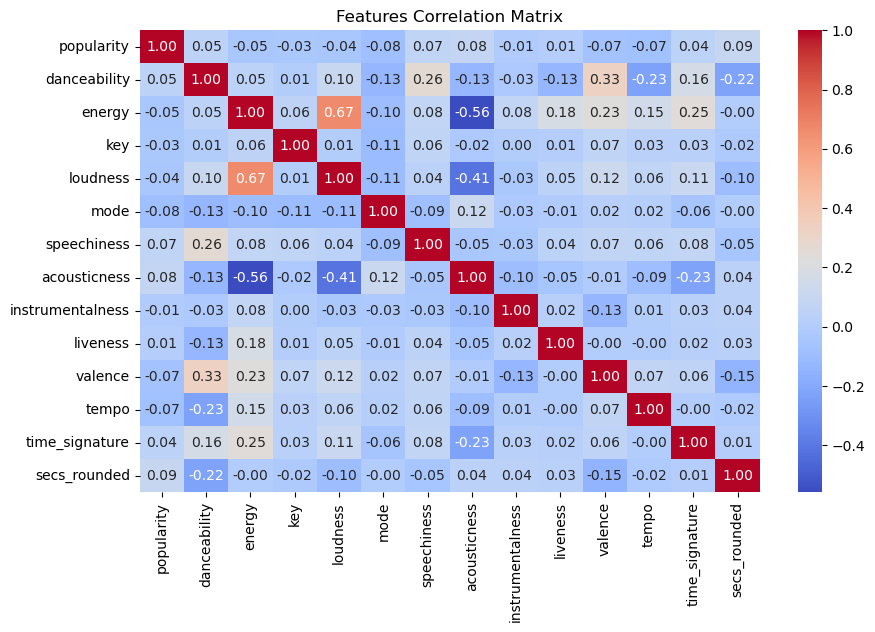

In [17]:
music_matrix = music_magic.corr()
plt.figure(figsize=(10, 6))
sns.heatmap(music_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Features Correlation Matrix')
plt.show()

In [18]:
# this is a curated df meant to showcase the numerical data visually based on genres' features
visuals = new_df.drop(columns=['artist', 'album'], axis=1)

# segmented genres
p_visuals = visuals[visuals['genre'] == 'pop']
r_visuals = visuals[visuals['genre'] == 'rock']
hh_visuals = visuals[visuals['genre'] == 'hip-hop']
rnb_visuals = visuals[visuals['genre'] == 'r-n-b']
edm_visuals = visuals[visuals['genre'] == 'edm']

In [19]:
fig = px.scatter(visuals, x="energy", y="loudness",
 	         size="key", color="genre",
                  hover_name="valence", log_x=True, size_max=15, title='Energy and Loudness Grouped by Genre') #changing the size_max scales the circles' sizes
fig.show()

In this scatterplot it visualizes songs between energy and loudness. The circle size of each scatter point is determined by the key of the song. The higher key values represents songs with higher key values and the smaller circles represent songs with lower key values.

The trend with this scatterplot seems to be a positive relationship between energy and loudness, which makes sense since high energy songs are often louder, and low energy songs tend to be softer.  

In [20]:
fig = px.bar(visuals, x="genre", y="key", color="explicit", title="Explicit Lyrics by Genre")
fig.show()

After analyzing the bar graphs for the genres we are working with, it becomes clear that there is a distinct difference between songs with explicit lyrics and those without. The data shows that the hip-hop genre has the highest number of songs containing explicit lyrics, while the rock genre features significantly fewer explicit tracks.

I want to create a full visual analysis (pie chart, smth else) but also respectively for all 5 genres in the form of a function.
analyzing them from a -- key(bar), energy, loudness, tempo (histogram), danceability, valence(pie)

## All 5 Genre Line-Ups

### Pop Visuals

In [21]:
fig = px.scatter(p_visuals, x="energy", y="loudness",
	         size="key", color="valence",
                 hover_name="genre", log_x=True, size_max=30, title='Energy vs Loudness of Songs Categorized by Valence') #changing the size_max scales the circles' sizes
fig.show()

In [22]:
p_visuals['valence'].describe()

count    1000.000000
mean        0.506223
std         0.212209
min         0.038300
25%         0.344000
50%         0.498000
75%         0.678250
max         0.969000
Name: valence, dtype: float64

In this scatter plot, we examine the relationship between energy and loudness, categorized by the valence of the songs. Valence refers to the mood of the song, with higher values indicating happier emotions and lower values suggesting sadder or more negative moods.

In our dataset, the mean valence for pop songs is approximately 0.51, indicating a generally positive mood. Additionally, 75% of the pop songs have a valence of 0.68 or lower, which shows that a significant portion of pop songs tends to be more upbeat.

This analysis suggests that energy and loudness are correlated with the valence of the songs, helping to identify their emotional content.

In [23]:
fig = px.sunburst(p_visuals, path=['explicit', 'key', 'tempo'], values='popularity',
                  title='Pop Genre Popularity Scale - Categorized by the Lyrical Explicitness, their keys and tempo')
#the values here start from center to outer and its popularity is viewed via hovering.
fig.show()

In the sunburst chart we created, it visualizes the lyrical explicitness, key, and tempo of songs. The songs are divided into non-explicit, represented by blue, and explicit songs, represented by red. Most songs are categorized as non-explicit, as this occupies the majority of the chart. The chart is divided into three sections: the center categorizes the songs by explicitness (non-explicit or explicit), the second layer represents the keys of the songs, and the third layer illustrates the tempo of the songs.

### Rock Genre

In [24]:
fig = px.scatter(r_visuals, x="energy", y="loudness",
 	         size="key", color="valence",
                  hover_name="genre", log_x=True, size_max=30, title='Energy vs Loudness of Songs Categorized by Valence') #changing the size_max scales the circles' sizes
fig.show()

In [25]:
r_visuals['valence'].describe()

count    1000.000000
mean        0.538903
std         0.234430
min         0.058200
25%         0.355750
50%         0.546000
75%         0.718000
max         0.976000
Name: valence, dtype: float64

In this scatter plot, we also compare the energy of the songs to their loudness, categorized by the valence of the songs. As shown by the visual and the descriptive statistics, the average valence for rock songs is approximately 0.54, indicating a generally positive mood. Additionally, 75% of the rock songs have a valence of 0.72 or lower, suggesting that most rock songs tend to be upbeat. In contrast, 25% of the songs have a valence of 0.36, indicating that a portion of rock songs may convey more negative or sadder emotions.

In [26]:
fig = px.sunburst(r_visuals, path=['explicit', 'key', 'tempo'], values='popularity',
                   title='Rock Genre Popularity Scale - Categorized by the Lyrical Explicitness, their keys and tempo')
# the values here start from center to outer and its popularity is viewed via hovering.
fig.show()

We also created a sunburst chart to visualize the lyrical explicitness, key, and tempo for the rock genre. The center of the sunburst chart represents the explicitness of the songs, categorized as explicit (red) and non-explicit (blue). As you can see, most of the songs in the rock genre are categorized as non-explicit. The second layer represents the key of the songs, ranging from 0 to 11, while the outer layer displays the tempo of the songs.

### Hip-Hop Genre

In [27]:
fig = px.scatter(hh_visuals, x="energy", y="loudness",
	         size="key", color="valence",
                 hover_name="genre", log_x=True, size_max=30, title='Energy vs Loudness of Songs Categorized by Valence in Hip-Hop') #changing the size_max scales the circles' sizes
fig.show()

In [28]:
hh_visuals['valence'].describe()

count    1000.000000
mean        0.551248
std         0.224913
min         0.037200
25%         0.388750
50%         0.550000
75%         0.722000
max         0.965000
Name: valence, dtype: float64

According to the scatter plot we created, the darker colors represent lower valence, while the lighter colors indicate higher valence for hip-hop songs. You can see that most of the songs are in lighter colors, suggesting they have a higher valence. Hip-hop songs have a mean valence of approximately 0.55, with 75% of the songs having a valence of 0.72. Compared to the previous genres, this indicates that hip-hop has a more positive mood than both rock and pop.

In [29]:
fig = px.sunburst(hh_visuals, path=['explicit', 'key', 'tempo'], values='popularity',
                  title='Hip-Hop Genre Popularity Scale - Categorized by the Lyrical Explicitness, their keys and tempo')
#the values here start from center to outer and its popularity is viewed via hovering.
fig.show()

In this sunburst chart, we compared lyrical explicitness with key and tempo. Although hip-hop has a higher valence than rock and pop, we can observe that this genre contains more than 25% of songs with explicit lyrics.

### R&B Genre

In [30]:
fig = px.scatter(rnb_visuals, x="energy", y="loudness",
	         size="key", color="valence",
                 hover_name="genre", log_x=True, size_max=30, title='Energy vs Loudness of Songs Categorized by Valence in RnB Genre') #changing the size_max scales the circles' sizes
fig.show()

In [31]:
rnb_visuals['valence'].describe()

count    1000.000000
mean        0.633164
std         0.241621
min         0.036400
25%         0.455000
50%         0.650000
75%         0.847250
max         0.994000
Name: valence, dtype: float64

he R&B genre exhibits a more scattered pattern compared to the previous charts (hip-hop, rock, and pop). According to the visual provided, 75% of the songs in the R&B genre have a valence of 0.84, indicating that most of the songs convey a more positive mood. In contrast, 25% of the songs have a valence of 0.45, suggesting that a portion of R&B songs may have a darker or more negative emotional tone.

In [32]:
fig = px.sunburst(rnb_visuals, path=['explicit', 'key', 'tempo'], values='popularity',
                  title='RnB Genre Popularity Scale - Categorized by the Lyrical Explicitness, their keys and tempo')
#the values here start from center to outer and its popularity is viewed via hovering.
fig.show()

In [33]:
rnb_visuals['key'].describe()

count    1000.000000
mean        5.743000
std         3.504173
min         0.000000
25%         2.000000
50%         7.000000
75%         9.000000
max        11.000000
Name: key, dtype: float64

In [34]:
rnb_visuals['tempo'].describe()

count    1000.000000
mean      124.038939
std        28.431107
min        51.037000
25%       101.502000
50%       124.378500
75%       143.860500
max       206.641000
Name: tempo, dtype: float64

In this sunburst chart created for the R&B genre, we can see that the majority of the songs do not have explicit lyrics. The average key for R&B songs is 5.7, which suggests that songs in a higher key may sound brighter and more energetic, while those in a lower key may sound deeper and more relaxed. Notably, 75% of the songs have a key value of 9 or higher, indicating a tendency towards more energetic keys, while 25% of the songs have a key value of 2, suggesting that a portion of the songs is more relaxed.

Regarding tempo, 75% of the R&B songs have a tempo of 143 BPM or higher, which is considered a high tempo (over 120 BPM). Conversely, 25% of the songs have a lower tempo of 101.

### EDM Genre

In [35]:
fig = px.scatter(edm_visuals, x="energy", y="loudness",
	         size="key", color="valence",
                 hover_name="genre", log_x=True, size_max=30, title='Energy vs Loudness for EDM Songs Categorized by Valence') #changing the size_max scales the circles' sizes
fig.show()

In [36]:
edm_visuals['valence'].describe()

count    1000.000000
mean        0.465198
std         0.198346
min         0.034100
25%         0.318000
50%         0.466000
75%         0.619000
max         0.962000
Name: valence, dtype: float64

While comparing energy and loudness by the valence of the songs, we can see that the EDM genre in our dataset has a mean valence of approximately 0.47, making it the lowest among the genres analyzed. Additionally, 75% of the EDM songs have a valence of 0.62, while 25% have a valence of 0.31.

In [37]:
fig = px.sunburst(edm_visuals, path=['explicit', 'key', 'tempo'], values='popularity',
                  title='EDM Genre Popularity Scale - Categorized by the Lyrical Explicitness, their keys and tempo')
#the values here start from center to outer and its popularity is viewed via hovering.
fig.show()

In [38]:
edm_visuals['key'].describe()

count    1000.000000
mean        5.754000
std         3.508246
min         0.000000
25%         2.000000
50%         6.000000
75%         8.000000
max        11.000000
Name: key, dtype: float64

In [39]:
edm_visuals['tempo'].describe()

count    1000.000000
mean      122.037299
std        22.292960
min        73.735000
25%       105.076000
50%       123.010500
75%       127.852500
max       213.928000
Name: tempo, dtype: float64

In [40]:
edm_visuals['explicit'].value_counts()

explicit
False    894
True     106
Name: count, dtype: int64

After comparing explicit lyrics, key, and tempo in the EDM genre, we see that there are a total of 894 songs without explicit lyrics and 106 songs that do contain explicit lyrics.

The average key for the EDM genre is 5.75, indicating that most songs fall in the middle range rather than being distinctly high or low. The average tempo of EDM songs is 122 BPM, which is considered upbeat, suggesting that the majority of EDM tracks maintain a lively and energetic pace.



### This is the entire Genres Analysis

In [41]:
music_magic_1 = data.drop(columns=['artist', 'album', 'track_name','explicit', 'duration_ms', 'genre'], axis=1)
music_magic_1.describe()

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,secs_rounded
count,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000,113999.000000
mean,33.238827,0.566801,0.641383,5.309126,-8.258950,0.637558,0.084652,0.314907,0.156051,0.213554,0.474066,122.147695,3.904034,228.513329
std,22.304959,0.173543,0.251530,3.559999,5.029357,0.480708,0.105733,0.332522,0.309556,0.190378,0.259261,29.978290,0.432623,107.298806
min,0.000000,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000
25%,17.000000,0.456000,0.472000,2.000000,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218500,4.000000,175.000000
50%,35.000000,0.580000,0.685000,5.000000,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000,213.000000
75%,50.000000,0.695000,0.854000,8.000000,-5.003000,1.000000,0.084500,0.597500,0.049000,0.273000,0.683000,140.071000,4.000000,262.000000
max,100.000000,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000,5238.000000


In [42]:
music_matrix_1 = music_magic_1.corr()
fig = px.imshow(music_matrix_1, aspect="auto")
fig.show()

Variables: The variables listed on both the x-axis and y-axis include features like "popularity," "danceability," "energy," "loudness," "speechiness," "acousticness," "valence," "tempo," and more.

Color Scale:

The color bar on the right shows the range of correlation values, from -1 (dark blue) to +1 (bright yellow).  

A correlation close to 1 (yellow) means a strong positive relationship between two features (when one increases, the other also increases).  

A correlation near -1 (dark blue) indicates a strong negative relationship (one feature increases as the other decreases).  

A correlation close to 0 (purple/pink) suggests little to no linear relationship.  


Example Interpretations:

The bright yellow diagonal indicates a perfect correlation (correlation = 1) between each variable and itself, which is expected.  

The correlation between popularity and energy is very low, around 0.001, meaning there is almost no linear relationship between these two variables.  

Loudness and energy seem to have a strong positive correlation, suggesting that songs with higher energy levels also tend to be louder.  

Some variables like acousticness and loudness may show a more negative correlation, indicating that more acoustic songs tend to be less loud.  

In [43]:
fig = px.scatter(data, x="energy", y="loudness",
	         size="key", color="genre",
                 hover_name="valence", log_x=True, size_max=15, title='Energy and Loudness Grouped by Genre') #changing the size_max scales the circles' sizes
fig.show()

### Danceability

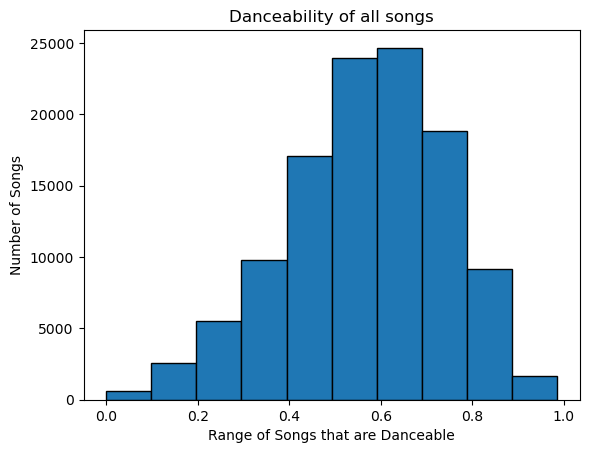

In [44]:
data['danceability'].plot(
kind='hist', edgecolor='black')
plt.title("Danceability of all songs")
plt.xlabel("Range of Songs that are Danceable")
plt.ylabel("Number of Songs")
plt.show()

By creating a histogram of the danceability of the songs, we can observe that it follows a normal distribution. The histogram is bell-shaped, featuring a single peak, with most values clustering around the mean.

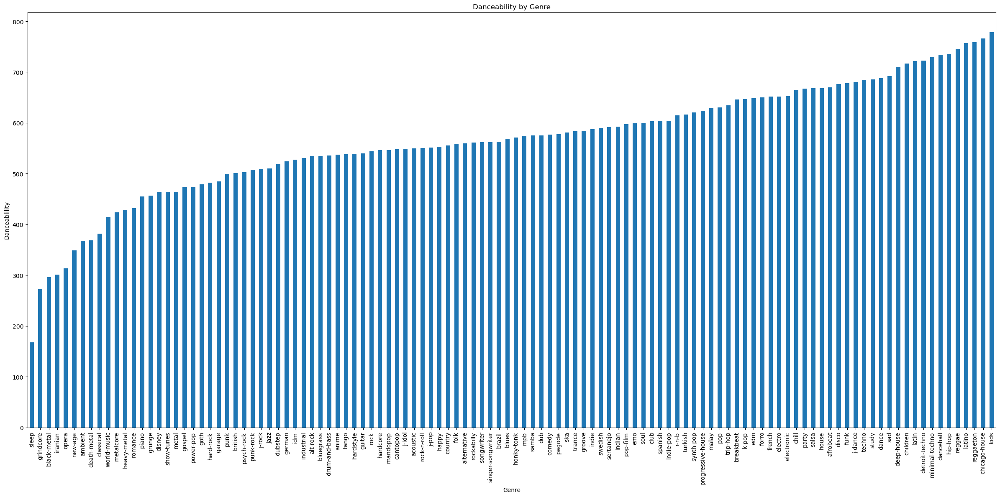

In [45]:
bar_graph = data.groupby("genre")["danceability"].sum().sort_values()
bar_graph.plot(kind="bar",
              title="Danceability by Genre",
              ylabel = "Danceablility",
              figsize=(24,12)
              )
plt.xlabel('Genre')
plt.tight_layout()
plt.show()

After grouping the data by genre, graphed the danceability of each genre. The results show that Kids is the most danceable genre, while sleep is the least danceable.

### Loudness

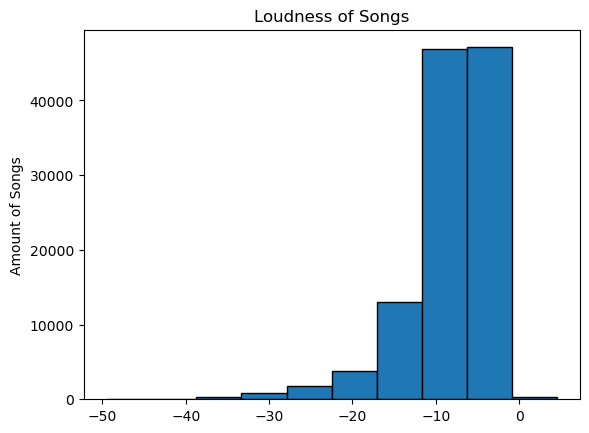

In [46]:
data['loudness'].plot(
kind='hist', edgecolor='black')
plt.title("Loudness of Songs")
plt.ylabel("Amount of Songs")
plt.show()

Considering the loudness of the songs in our dataframe, the histogram demonstrates a normal distribution, characterized by a bell-shaped curve. Most values are concentrated around the mean, indicating that the loudness levels of the songs follow this typical pattern.

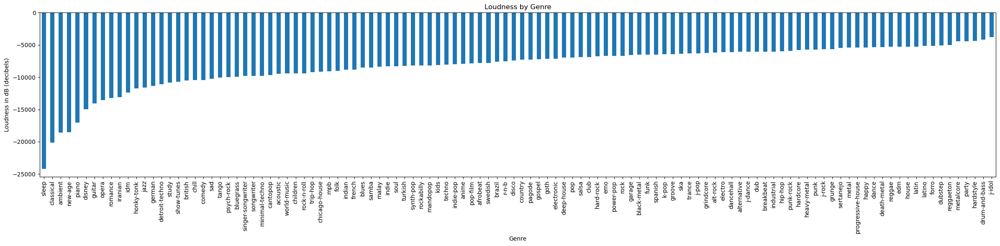

In [47]:
# Sample 75 values and group by genre, summing the loudness
bar_graph = data.groupby("genre")["loudness"].sum().sort_values()

# Create a bar graph
bar_graph.plot(kind="bar",
               title="Loudness by Genre",
               ylabel="Loudness in dB (decibels)",
               xlabel="Genre",
               figsize=(24,6)
              )
# Show the plot
plt.tight_layout()
plt.show()


In the histogram above, we plotted the loudness of various genres using decibels (dB) as the measurement tool. The genre with the lowest decibel level is sleep, followed by classical. The genre with the highest decibel level is J-Idol.

### Popularity

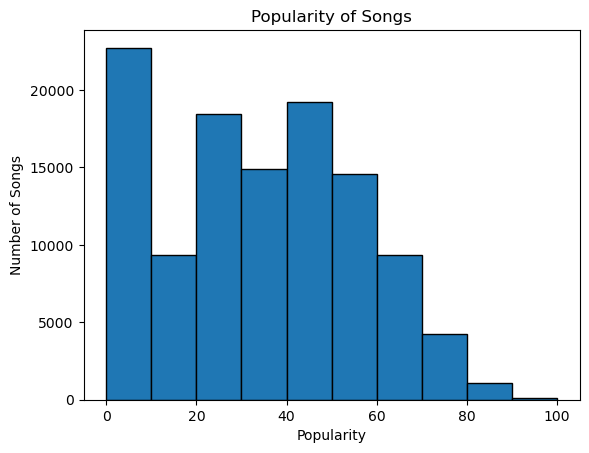

In [48]:
data['popularity'].plot(
    kind='hist',
    edgecolor='black'
)

# Add title and labels
plt.title("Popularity of Songs")
plt.xlabel("Popularity")
plt.ylabel("Number of Songs")

# Show the plot
plt.show()


Right-skewed: The distribution is skewed to the right, indicating that most songs have a relatively low popularity, while a few songs have exceptionally high popularity.  

Peak: The peak of the histogram is around 0-10, suggesting that the most common range of song popularity is between 0 and 10.


In [49]:
display(data['genre'].value_counts())

genre
acoustic             1000
afrobeat             1000
psych-rock           1000
progressive-house    1000
power-pop            1000
                     ... 
emo                  1000
electronic           1000
electro              1000
world-music          1000
k-pop                 999
Name: count, Length: 114, dtype: int64

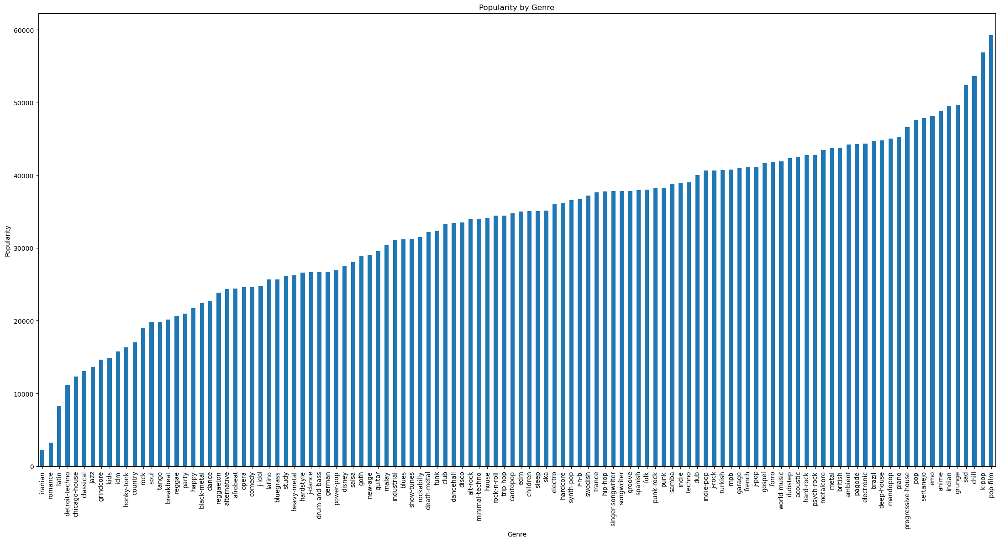

In [50]:

bar_graph = data.groupby("genre")["popularity"].sum().sort_values()


bar_graph.plot(kind="bar",
               title="Popularity by Genre",
               ylabel="Popularity",
               xlabel="Genre",
               figsize=(22,12)
              )
plt.tight_layout()
plt.show()



In this dataset, we examined the popularity of different genres based on all of the genres. The analysis shows that Pop-Film is the most popular genre, followed by K-Pop in second place. Chill ranks third, while Iranian Music is the least popular genre in the dataset.

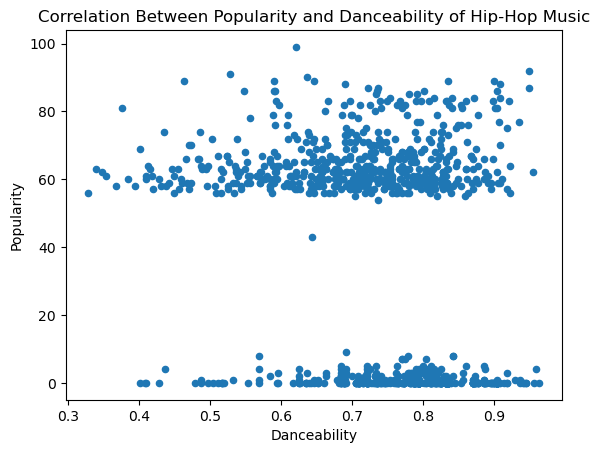

In [51]:
correlation_hiphop = data[data["genre"] == "hip-hop" ]

correlation_hiphop.plot(kind="scatter",
       x="danceability",
       y="popularity",
       ylabel="Popularity",
       xlabel="Danceability",
       title="Correlation Between Popularity and Danceability of Hip-Hop Music")
plt.show()

We did not find a correlation between danceability and song popularity.

## Machine Learning

In [52]:
data.info()
display(data.head())

<class 'pandas.core.frame.DataFrame'>
Index: 113999 entries, 0 to 113999
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   artist            113999 non-null  object 
 1   album             113999 non-null  object 
 2   track_name        113999 non-null  object 
 3   popularity        113999 non-null  int64  
 4   duration_ms       113999 non-null  int64  
 5   explicit          113999 non-null  bool   
 6   danceability      113999 non-null  float64
 7   energy            113999 non-null  float64
 8   key               113999 non-null  int64  
 9   loudness          113999 non-null  float64
 10  mode              113999 non-null  int64  
 11  speechiness       113999 non-null  float64
 12  acousticness      113999 non-null  float64
 13  instrumentalness  113999 non-null  float64
 14  liveness          113999 non-null  float64
 15  valence           113999 non-null  float64
 16  tempo             113999 

,artist,album,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,genre,secs_rounded
0,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic,231
1,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic,150
2,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic,211
3,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic,202
4,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic,199


### Define Features & Target

In [53]:
# Come back to drop ['explicit'] if necessary
# Dropping columns not necessary for models

data = data.drop(['track_name', 'artist', 'album', 'explicit'], axis=1)

In [54]:
#Define features and target
X = data.drop(columns=['genre'])
y = data['genre']

### Splitting Data

In [55]:
def train_val_test_split(X, y, stratify=None, rstate=42, shuffle=True):
    strat = stratify if stratify is not None else None

    X_train, X_temp, y_train, y_temp = train_test_split(
        X, y, test_size=0.4, random_state=rstate, shuffle=shuffle, stratify=strat
    )

    X_val, X_test, y_val, y_test = train_test_split(
        X_temp, y_temp, test_size=0.5, random_state=rstate, shuffle=shuffle
    )

    return (X_train, X_val, X_test, y_train, y_val, y_test)


In [56]:
X = data.drop(columns=['genre'])
y = data['genre']

In [57]:
X_train, X_val, X_test, y_train, y_val, y_test = train_val_test_split(X, y, stratify=y)

In [58]:
# #splitting data into training, validation, and test sets at a ratio of 60:20:20

# #split training and test sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=12345, stratify=y)

# #split validation set
# X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.25, random_state=12345, stratify=y_train)

# print(X_train.shape)
# print(y_train.shape)
# print(X_valid.shape)
# print(X_test.shape)


### Encoding

In [59]:
#One-Hot encoding the target column
categorical_cols = ['genre']
# data_ohe_train = pd.get_dummies(y_train, columns=categorical_cols, drop_first=True)
# data_ohe_valid = pd.get_dummies(y_test, columns=categorical_cols, drop_first=True)
# data_ohe_test = pd.get_dummies(y_valid, columns=categorical_cols, drop_first=True)

In [60]:
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_valid_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)


### Feature Scaling

In [61]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 68399 entries, 111067 to 46962
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   popularity        68399 non-null  int64  
 1   duration_ms       68399 non-null  int64  
 2   danceability      68399 non-null  float64
 3   energy            68399 non-null  float64
 4   key               68399 non-null  int64  
 5   loudness          68399 non-null  float64
 6   mode              68399 non-null  int64  
 7   speechiness       68399 non-null  float64
 8   acousticness      68399 non-null  float64
 9   instrumentalness  68399 non-null  float64
 10  liveness          68399 non-null  float64
 11  valence           68399 non-null  float64
 12  tempo             68399 non-null  float64
 13  time_signature    68399 non-null  int64  
 14  secs_rounded      68399 non-null  int64  
dtypes: float64(9), int64(6)
memory usage: 8.3 MB


In [62]:
def scaling(X_train, X_valid, X_test):
    scaler = StandardScaler()

    X_train = scaler.fit_transform(X_train)
    X_valid = scaler.transform(X_valid)
    X_test = scaler.transform(X_test)
    return X_train, X_valid, X_test

scaling(X_train, X_val, X_test)

(array([[ 0.83979039,  0.72072745,  0.90097942, ..., -0.22283658,
          0.22278611,  0.72157374],
        [ 0.88458543, -0.552401  ,  0.49756694, ..., -0.67207277,
          0.22278611, -0.5530501 ],
        [-0.0113155 ,  0.75071102,  0.31314981, ...,  0.3876185 ,
          0.22278611,  0.75054246],
        ...,
        [ 1.3325359 , -0.15732281, -1.3638935 , ...,  0.69753671,
          0.22278611, -0.15714421],
        [-0.54885606,  0.81688732, -0.26315373, ..., -1.24770671,
         -2.0815156 ,  0.81813615],
        [-0.77283129,  1.61644919,  0.23246731, ...,  1.32388333,
          0.22278611,  1.61960418]]),
 array([[-1.48955204e+00,  1.55284153e+00, -1.40999779e+00, ...,
          1.73449241e+00, -2.08151560e+00,  1.55201049e+00],
        [-3.69675871e-01, -3.01122898e-03, -1.23710672e+00, ...,
         -2.52750052e-01, -2.08151560e+00, -2.64435233e-03],
        [-1.48955204e+00, -7.33432240e-01,  1.02200317e+00, ...,
         -1.27241202e+00, -2.08151560e+00, -7.36518687e-

In [63]:
xtrain, xval, xtest = scaling(X_train, X_val, X_test)

In [64]:
from scipy.stats import ks_2samp

# Example for comparing a single feature
for col in X_train.columns:
    stat, p_value = ks_2samp(X_train[col], X_val[col])
    print(f'Feature: {col} - KS Statistic: {stat}, p-value: {p_value}')


Feature: popularity - KS Statistic: 0.004247473480555097, p-value: 0.9159331326954623
Feature: duration_ms - KS Statistic: 0.005361031106692504, p-value: 0.7073771964876334
Feature: danceability - KS Statistic: 0.007579934737939886, p-value: 0.2781497771048844
Feature: energy - KS Statistic: 0.007269455822043136, p-value: 0.3251858090017533
Feature: key - KS Statistic: 0.007524725918071518, p-value: 0.2861377803430004
Feature: loudness - KS Statistic: 0.00668628709304514, p-value: 0.4272612118005068
Feature: mode - KS Statistic: 0.0038982237351884996, p-value: 0.9564514674109224
Feature: speechiness - KS Statistic: 0.004614348137335578, p-value: 0.8580356399136743
Feature: acousticness - KS Statistic: 0.004850342789971013, p-value: 0.8140393520011542
Feature: instrumentalness - KS Statistic: 0.007566695855561689, p-value: 0.280050515427234
Feature: liveness - KS Statistic: 0.007725357890992046, p-value: 0.25788064256849985
Feature: valence - KS Statistic: 0.010648301901407753, p-value:

Had to add this step because for some reason with the previous splitting there were problems causing the ML algorithms to crash, so i did this test and redid the splitting

In [65]:
sample_fraction = 0.5
sample_size = int(xtrain.shape[0] * sample_fraction)

sample_indices = np.random.choice(xtrain.shape[0], size=sample_size, replace=False)

xtrain_sample = xtrain[sample_indices]
y_train_encoded_sample = y_train_encoded[sample_indices]


#### Evaluation Metrics

The primary evaluation metric for the models will be the F1 score. This score takes the mean of precision and recall scores and ranges between 0 and 1.

The secondary evaluation metric for our models is accuracy score. The accuracy score is a percentage of predictions that were made corrrectly by the model.

In [66]:
# evaluation function to score and plot F1 score and confusion matrix

def eval_classifier(y_true, y_pred):

    f1 = f1_score(y_true, y_pred, average='weighted')
    print(f'F1: {f1:.2f}')

    accuracy = accuracy_score(y_true, y_pred)
    print('Accuracy Score:', accuracy)

    # print('\n--------------- Classification Report ---------------\n')
    # print(classification_report(y_test, y_pred))

    cm = confusion_matrix(y_true, y_pred, normalize='all')
    print('Confusion Matrix')
    print(cm)

In [67]:
xtrain

array([[ 0.83979039,  0.72072745,  0.90097942, ..., -0.22283658,
         0.22278611,  0.72157374],
       [ 0.88458543, -0.552401  ,  0.49756694, ..., -0.67207277,
         0.22278611, -0.5530501 ],
       [-0.0113155 ,  0.75071102,  0.31314981, ...,  0.3876185 ,
         0.22278611,  0.75054246],
       ...,
       [ 1.3325359 , -0.15732281, -1.3638935 , ...,  0.69753671,
         0.22278611, -0.15714421],
       [-0.54885606,  0.81688732, -0.26315373, ..., -1.24770671,
        -2.0815156 ,  0.81813615],
       [-0.77283129,  1.61644919,  0.23246731, ...,  1.32388333,
         0.22278611,  1.61960418]])

### Model Training

#### Multiclass Logistic Regression

This was added because we can solve this using a normal ordinal encoding since it doesnt matter to use it for the output, at least in this case. Tomorrow i can explain better in a call.

In [68]:
%%time

lr_clf = LogisticRegression()

lr_clf.fit(xtrain_sample, y_train_encoded_sample)

CPU times: user 15.2 s, sys: 8.22 s, total: 23.4 s
Wall time: 25.9 s


LogisticRegression()

In [69]:
eval_classifier(y_train_encoded, lr_clf.predict(xtrain))

F1: 0.17
Accuracy Score: 0.1995643211158058
Confusion Matrix
[[8.47965614e-04 0.00000000e+00 4.38602904e-05 ... 0.00000000e+00
  4.38602904e-05 2.77781839e-04]
 [1.46200968e-05 1.34504890e-03 1.46200968e-05 ... 2.92401936e-05
  2.92401936e-05 1.46200968e-05]
 [0.00000000e+00 0.00000000e+00 1.46200968e-05 ... 0.00000000e+00
  1.46200968e-05 1.75441161e-04]
 ...
 [2.92401936e-05 3.80122516e-04 0.00000000e+00 ... 7.74865130e-04
  2.04681355e-04 2.04681355e-04]
 [4.38602904e-05 0.00000000e+00 5.84803871e-05 ... 2.92401936e-05
  8.33345517e-04 8.77205807e-05]
 [1.31580871e-04 0.00000000e+00 8.77205807e-05 ... 0.00000000e+00
  0.00000000e+00 2.51465665e-03]]


In [70]:
eval_classifier(y_valid_encoded, lr_clf.predict(xval))

F1: 0.17
Accuracy Score: 0.19824561403508772
Confusion Matrix
[[1.05263158e-03 4.38596491e-05 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 3.07017544e-04]
 [0.00000000e+00 1.35964912e-03 4.38596491e-05 ... 1.75438596e-04
  1.75438596e-04 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.38596491e-05
  4.38596491e-05 1.31578947e-04]
 ...
 [0.00000000e+00 3.07017544e-04 0.00000000e+00 ... 7.01754386e-04
  4.38596491e-05 8.77192982e-05]
 [0.00000000e+00 0.00000000e+00 4.38596491e-05 ... 0.00000000e+00
  6.57894737e-04 8.77192982e-05]
 [8.77192982e-05 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  1.75438596e-04 2.28070175e-03]]


#### Random Forest

In [71]:
rf_clf = RandomForestClassifier(random_state=42)


In [72]:
rf_clf.fit(xtrain_sample, y_train_encoded_sample)

y_rf_pred = rf_clf.predict(xval)

eval_classifier(y_valid_encoded, y_rf_pred)

F1: 0.30
Accuracy Score: 0.31666666666666665
Confusion Matrix
[[1.53508772e-03 0.00000000e+00 8.77192982e-05 ... 0.00000000e+00
  0.00000000e+00 1.31578947e-04]
 [0.00000000e+00 2.76315789e-03 0.00000000e+00 ... 2.63157895e-04
  1.31578947e-04 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 5.26315789e-04 ... 4.38596491e-05
  0.00000000e+00 1.31578947e-04]
 ...
 [0.00000000e+00 1.22807018e-03 0.00000000e+00 ... 2.10526316e-03
  0.00000000e+00 4.38596491e-05]
 [4.38596491e-05 0.00000000e+00 0.00000000e+00 ... 1.31578947e-04
  2.63157895e-03 4.38596491e-05]
 [1.31578947e-04 0.00000000e+00 1.31578947e-04 ... 0.00000000e+00
  4.38596491e-05 2.50000000e-03]]


In [73]:
importances = rf_clf.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)


##### Feature Selection and Hyperparameter Tuning

In [74]:
param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_depth': [30],
    'min_samples_split': [5],
    'min_samples_leaf': [1, 2]
}


Amount of parameters were reduced and changed after several tries of the algorithm

In [75]:
# grid_search = GridSearchCV(estimator=rf_clf, param_grid=param_grid_rf,
#                            cv=3, n_jobs=-1, verbose=2)
# grid_search.fit(xtrain, y_train_encoded)

# best_model_rf = grid_search.best_estimator_

This is commented to prevent it from running in the future. The best algorithm was already selected before showing little improvement as to a no tunning class

In [76]:
# best_params_rf = grid_search.best_params_
# print("Best Hyperparameters:", best_params)

In [77]:
best_model_rf = RandomForestClassifier(n_estimators=200, min_samples_split=5, min_samples_leaf=1, max_depth=30, random_state=42)
best_model_rf.fit(xtrain_sample, y_train_encoded_sample)

RandomForestClassifier(max_depth=30, min_samples_split=5, n_estimators=200,
                       random_state=42)

In [80]:
y_pred_rf_tuned_train = best_model_rf.predict(xtrain_sample)
y_pred_rf_tuned_val = best_model_rf.predict(xval)
print('Training Set')
eval_classifier(y_train_encoded_sample, y_pred_rf_tuned_train)
print('Validation Set')
eval_classifier(y_valid_encoded, y_pred_rf_tuned_val)

Training Set
F1: 0.91
Accuracy Score: 0.9083891341852101
Confusion Matrix
[[8.15813328e-03 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 9.32775812e-03 0.00000000e+00 ... 2.92406211e-05
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 6.08204918e-03 ... 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 9.00611129e-03
  0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 5.84812421e-05 ... 0.00000000e+00
  9.24003626e-03 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 8.71370508e-03]]
Validation Set
F1: 0.31
Accuracy Score: 0.32359649122807016
Confusion Matrix
[[1.35964912e-03 0.00000000e+00 8.77192982e-05 ... 0.00000000e+00
  4.38596491e-05 1.75438596e-04]
 [0.00000000e+00 2.58771930e-03 0.00000000e+00 ... 3.50877193e-04
  1.75438596e-04 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 5.70175439e-04 ... 

#### XGBoost Multi-Class Classification

In [82]:
%%time
xgb_clf = XGBClassifier(objective='multi:softmax',
                        eval_metric=['merror', 'mlogloss'],
                        num_class=len(y_train.unique()),
                        use_label_encoder=False,
                        random_state=42,
                        early_stopping_rounds=10)

xgb_clf.fit(xtrain_sample, y_train_encoded_sample,
            eval_set=[(xval, y_valid_encoded)])


[0]	validation_0-merror:0.76408	validation_0-mlogloss:3.71736
[1]	validation_0-merror:0.75509	validation_0-mlogloss:3.48420
[2]	validation_0-merror:0.74768	validation_0-mlogloss:3.33807
[3]	validation_0-merror:0.74184	validation_0-mlogloss:3.23966
[4]	validation_0-merror:0.73500	validation_0-mlogloss:3.16153
[5]	validation_0-merror:0.73022	validation_0-mlogloss:3.10146
[6]	validation_0-merror:0.72917	validation_0-mlogloss:3.05216
[7]	validation_0-merror:0.72605	validation_0-mlogloss:3.01110
[8]	validation_0-merror:0.72404	validation_0-mlogloss:2.97855
[9]	validation_0-merror:0.72219	validation_0-mlogloss:2.95017
[10]	validation_0-merror:0.71952	validation_0-mlogloss:2.92740
[11]	validation_0-merror:0.71855	validation_0-mlogloss:2.90592
[12]	validation_0-merror:0.71618	validation_0-mlogloss:2.88797
[13]	validation_0-merror:0.71553	validation_0-mlogloss:2.87334
[14]	validation_0-merror:0.71522	validation_0-mlogloss:2.85920
[15]	validation_0-merror:0.71285	validation_0-mlogloss:2.84791
[1

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=10,
              enable_categorical=False, eval_metric=['merror', 'mlogloss'],
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_class=114, num_parallel_tree=None, ...)

In [83]:
print('Training Set')
eval_classifier(y_train_encoded_sample, xgb_clf.predict(xtrain_sample))
print('Validation Set')
eval_classifier(y_valid_encoded, xgb_clf.predict(xval))

Training Set
F1: 0.75
Accuracy Score: 0.7508699084768561
Confusion Matrix
[[5.20483055e-03 0.00000000e+00 0.00000000e+00 ... 8.77218632e-05
  5.84812421e-05 1.16962484e-04]
 [0.00000000e+00 7.66104272e-03 0.00000000e+00 ... 8.77218632e-05
  1.16962484e-04 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 5.00014620e-03 ... 2.92406211e-05
  5.84812421e-05 2.92406211e-05]
 ...
 [2.92406211e-05 2.33924969e-04 0.00000000e+00 ... 7.28091465e-03
  2.92406211e-05 2.92406211e-05]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.16962484e-04
  7.57332086e-03 2.92406211e-05]
 [5.84812421e-05 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  0.00000000e+00 6.75458347e-03]]
Validation Set
F1: 0.29
Accuracy Score: 0.298640350877193
Confusion Matrix
[[1.66666667e-03 0.00000000e+00 8.77192982e-05 ... 0.00000000e+00
  0.00000000e+00 2.19298246e-04]
 [0.00000000e+00 1.88596491e-03 0.00000000e+00 ... 5.26315789e-04
  1.75438596e-04 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 7.89473684e-04 ... 8.

#### MLP

In [84]:
mlp_clf = MLPClassifier(hidden_layer_sizes=(128, 64),
                        activation='relu',
                        solver='adam',
                        learning_rate_init=0.001,
                        max_iter=200,
                        random_state=42)

mlp_clf.fit(xtrain_sample, y_train_encoded_sample)


MLPClassifier(hidden_layer_sizes=(128, 64), random_state=42)

In [86]:
y_pred_train_mlp = mlp_clf.predict(xtrain_sample)
y_pred_valid_mlp = mlp_clf.predict(xval)
print('Training Set')
eval_classifier(y_train_encoded_sample, y_pred_train_mlp)
print('Validation Set')
eval_classifier(y_valid_encoded, y_pred_valid_mlp)

Training Set
F1: 0.38
Accuracy Score: 0.39290622532822594
Confusion Matrix
[[1.43279043e-03 0.00000000e+00 0.00000000e+00 ... 8.77218632e-05
  2.92406211e-05 1.16962484e-04]
 [0.00000000e+00 3.62583701e-03 0.00000000e+00 ... 5.84812421e-04
  1.75443726e-04 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.22810608e-03 ... 2.92406211e-05
  8.77218632e-05 2.92406211e-05]
 ...
 [0.00000000e+00 6.14053042e-04 2.92406211e-05 ... 3.74279950e-03
  5.84812421e-05 2.92406211e-05]
 [2.92406211e-05 0.00000000e+00 0.00000000e+00 ... 1.16962484e-04
  5.38027428e-03 0.00000000e+00]
 [5.84812421e-05 5.84812421e-05 0.00000000e+00 ... 0.00000000e+00
  8.77218632e-05 3.39191204e-03]]
Validation Set
F1: 0.28
Accuracy Score: 0.2939912280701754
Confusion Matrix
[[9.21052632e-04 0.00000000e+00 8.77192982e-05 ... 4.38596491e-05
  4.38596491e-05 1.31578947e-04]
 [0.00000000e+00 1.92982456e-03 0.00000000e+00 ... 4.82456140e-04
  2.63157895e-04 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 7.89473684e-04 ... 

#### Lightbm

In [ ]:
# %%time
# lgbm_clf = LGBMClassifier(
#     n_estimators=100,
#     max_depth=10,
#     learning_rate=0.01,
#     min_data_in_leaf=20,
#     random_state=42,
#     reg_alpha=1,
#     reg_lambda=1,
#     early_stopping_rounds=10
# )
# lgbm_clf.fit(xtrain, y_train_encoded, eval_set=(xval, y_valid_encoded))

In [ ]:
# y_pred_train_lgbm = lgbm_clf.predict(xtrain)
# y_pred_valid_lgbm = lgbm_clf.predict(xval)
# print('Training Set')
# eval_classifier(y_train_encoded, y_pred_train_lgbm)
# print('Validation Set')
# eval_classifier(y_valid_encoded, y_pred_valid_lgbm)

#### SVC

In [87]:
svc_clf = SVC(probability=True, kernel='rbf', random_state=42)
np.random.seed(42)


svc_clf.fit(xtrain_sample, y_train_encoded_sample)

SVC(probability=True, random_state=42)

In [88]:
# y_pred_train_svc = svc_clf.predict(xtrain)
y_pred_valid_svc = svc_clf.predict(xval)
# print('Training Set')
# eval_classifier(y_train_encoded, y_pred_train_svc)
print('Validation Set')
eval_classifier(y_valid_encoded, y_pred_valid_svc)

Validation Set
F1: 0.23
Accuracy Score: 0.25263157894736843
Confusion Matrix
[[1.31578947e-03 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  8.77192982e-05 1.75438596e-04]
 [0.00000000e+00 1.75438596e-03 4.38596491e-05 ... 2.19298246e-04
  1.31578947e-04 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 2.19298246e-04 ... 4.38596491e-05
  8.77192982e-05 1.31578947e-04]
 ...
 [8.77192982e-05 6.14035088e-04 0.00000000e+00 ... 1.14035088e-03
  1.31578947e-04 0.00000000e+00]
 [8.77192982e-05 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  2.76315789e-03 0.00000000e+00]
 [1.75438596e-04 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  1.31578947e-04 2.50000000e-03]]


#### Soft Voting Classifier

In [89]:
estimators=[
    ('log_reg', lr_clf),
    ('rf_clf', best_model_rf),
    ('xgb_clf', xgb_clf),
    ('svc_clf', svc_clf),
    ('mlp_clf', mlp_clf)
]

In [90]:
def manual_soft_voting_proba(models, X):
    probas = []

    for name, model in models:
        probas.append(model.predict_proba(X))

    averaged_proba = sum(probas) / len(models)

    return averaged_proba


In [91]:
proba_soft_voting_train = manual_soft_voting_proba(estimators, xtrain)
y_pred_soft_voting_train = np.argmax(proba_soft_voting_train, axis=1)

proba_soft_voting_val = manual_soft_voting_proba(estimators, xval)
y_pred_soft_voting_val = np.argmax(proba_soft_voting_val, axis=1)

print('Training Set')
eval_classifier(y_train_encoded, y_pred_soft_voting_train)
print('Validation Set')
eval_classifier(y_valid_encoded, y_pred_soft_voting_val)

Training Set
F1: 0.54
Accuracy Score: 0.5454904311466542
Confusion Matrix
[[3.80122516e-03 0.00000000e+00 0.00000000e+00 ... 0.00000000e+00
  8.77205807e-05 1.31580871e-04]
 [0.00000000e+00 5.02931329e-03 0.00000000e+00 ... 3.07022032e-04
  5.84803871e-05 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 2.86553897e-03 ... 2.92401936e-05
  2.92401936e-05 7.31004839e-05]
 ...
 [1.46200968e-05 4.09362710e-04 0.00000000e+00 ... 4.64919078e-03
  5.84803871e-05 5.84803871e-05]
 [0.00000000e+00 0.00000000e+00 2.92401936e-05 ... 1.02340677e-04
  6.06734017e-03 1.46200968e-05]
 [1.46200968e-04 1.46200968e-05 4.38602904e-05 ... 0.00000000e+00
  4.38602904e-05 4.91235252e-03]]
Validation Set
F1: 0.31
Accuracy Score: 0.32412280701754387
Confusion Matrix
[[1.57894737e-03 0.00000000e+00 8.77192982e-05 ... 0.00000000e+00
  4.38596491e-05 1.31578947e-04]
 [0.00000000e+00 2.41228070e-03 0.00000000e+00 ... 3.07017544e-04
  2.63157895e-04 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 6.14035088e-04 ... 

## Conclusion